# Comparing SHAP across different backbone models

## 0.Load libraries

In [ ]:
! pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt

import shap
import tensorflow as tf
import tensorflow.compat.v1.keras.backend as K

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions
# import keras.backend as K
tf.compat.v1.disable_eager_execution()

import torch, torchvision
from torch import nn
from torchvision import transforms, models, datasets

from keras.preprocessing import image
import keras.utils as image
from keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.utils import img_to_array

# SHAP

In [ ]:
#load data
X,y = shap.datasets.imagenet50()

# load the ImageNet 1K class names
url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
fname = shap.datasets.cache(url)
with open(fname) as f:
    class_names_1K = json.load(f)

# load the ImageNet 22K class names
# https://storage.googleapis.com/bit_models/imagenet21k_wordnet_ids.txt
url = "https://storage.googleapis.com/bit_models/imagenet21k_wordnet_ids.txt"
fname = shap.datasets.cache(url)
with open(fname) as f:
  wordnet_id = [i.strip("\n") for i in f.readlines()]


#imagenet22K wordnetID
url = "https://storage.googleapis.com/bit_models/imagenet21k_wordnet_lemmas.txt"
fname = shap.datasets.cache(url)
with open(fname) as f:
  class_names = [i.strip("\n") for i in f.readlines()]
    # class_names = json.load(f)

#mapping predictions to imagenet2K labels
res = {}
for key in wordnet_id:
    for value in class_names:
        res[key] = value
        class_names.remove(value)
        break

In [ ]:
def reshape_img(to_explain):
  img = image.img_to_array(to_explain).astype('float32')/255
  # img = img_to_array(img).astype('float32')/255
  img = np.expand_dims(img, axis=0)
  return(img)

def normalize_img(to_explain):
  norm_img = image.img_to_array(to_explain)# Transforming the image to get the shape as [channel, height, width]
  norm_img = np.expand_dims(norm_img, axis=0) # Adding dimension to convert array into a batch of size (1,299,299,3)
  norm_img = norm_img/255.0
  return(norm_img)

## VGG16

In [ ]:
# load pre-trained model
model_vgg16 = VGG16(weights='imagenet', include_top=True)

In [ ]:
# explain how the input to the 7th layer of the model explains the top two classes
def map2layer(x, layer):
    feed_dict = dict(zip([model_vgg16.layers[0].input], [preprocess_input(x.copy())]))
    return K.get_session().run(model_vgg16.layers[layer].input, feed_dict)

e = shap.GradientExplainer((model_vgg16.layers[7].input, model_vgg16.layers[-1].output), map2layer(preprocess_input(X.copy()), 7))


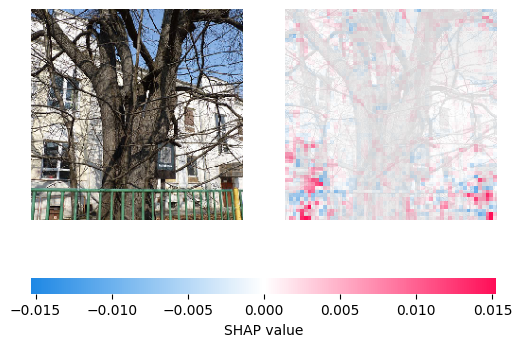

<Figure size 640x480 with 0 Axes>

In [ ]:
to_explain = X[[0]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=1)

# get the names for the classes from imagenet 1K labels
# index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
# index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
# class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, 
                to_explain.astype(int)
  # , class_names_22K
  )

plt.savefig('shap_vgg16_' +str(0)+ '.png')

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


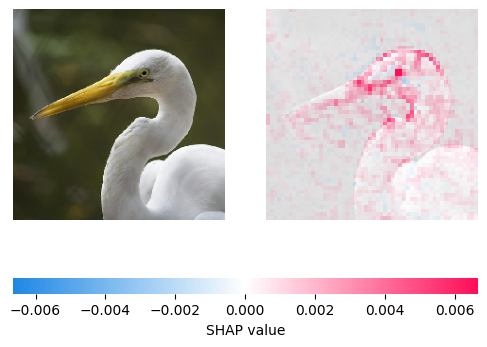

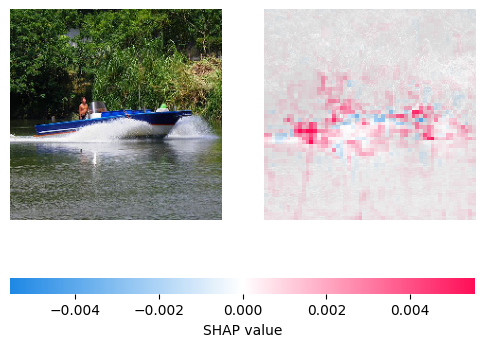

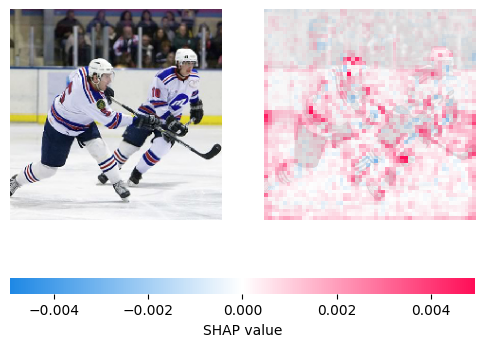

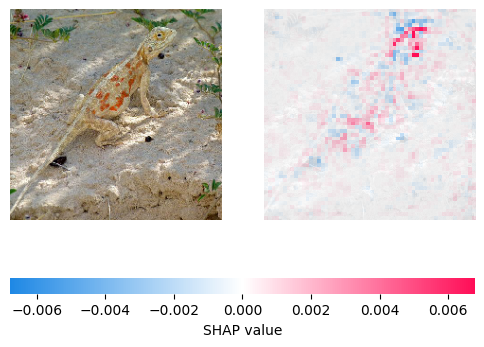

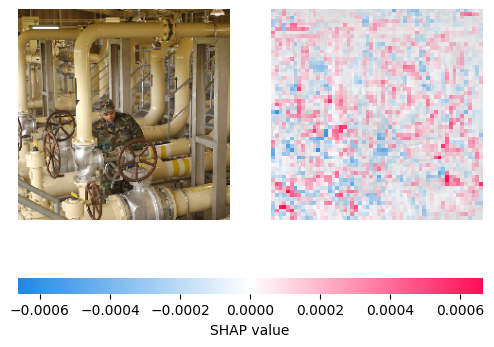

...

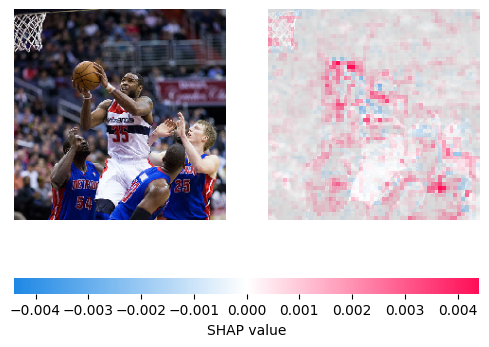

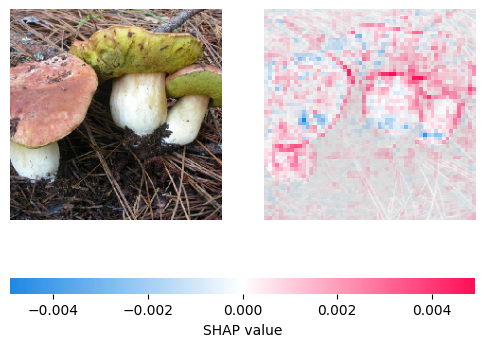

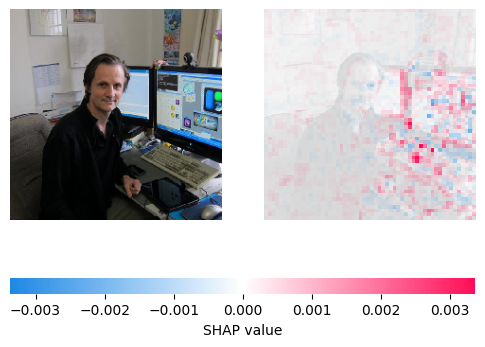

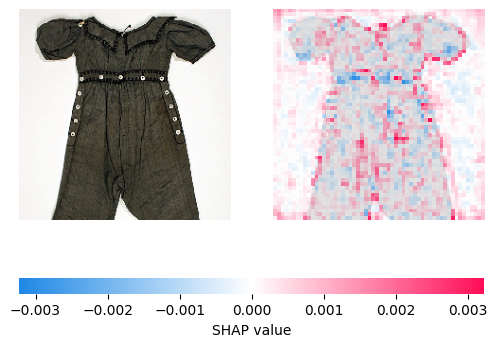

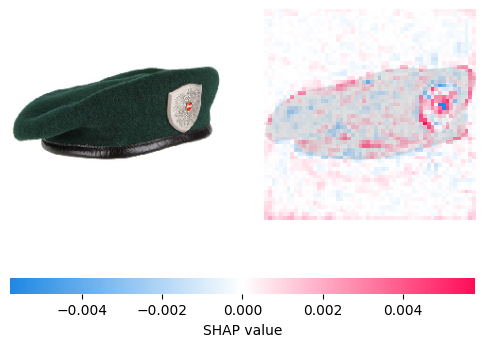

In [ ]:
for i in range(0,50):
  to_explain = X[[i]]

  shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=1)

  # plot the explanations
  shap.image_plot(shap_values, 
                to_explain.astype(int), show = False
  # , class_names_22K
  )

  plt.savefig('shap_vgg16_' +str(i)+ '.png')

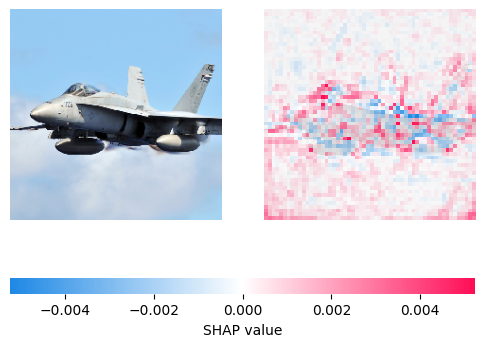

In [ ]:
i=49
to_explain = X[[i]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=1)

# plot the explanations
shap.image_plot(shap_values, 
            to_explain.astype(int), show = False
# , class_names_22K
)

plt.savefig('shap_vgg16_' +str(i)+ '.png')

In [ ]:
# shap_np = np.array(shap_values)
# # shap_values.data = inv_transform(shap_values.data).cpu().numpy()[0] #
# shap_numpy = np.array(shap_values).transpose(0,1,3,4,2)
# # shap_numpy = np.array(shap_numpy)

In [ ]:
#to crop images for evaluation
import cv2
image = cv2.imread(r'shap_vgg16_0.png')

y=320
x=120
h=540
w=340
crop_image = image[x:w, y:h]

cv2.imwrite('test_cropped.png',crop_image)
# cv2.waitKey(0)

True

In [ ]:
#convert to grayscale
from PIL import Image
img = Image.open('shap_vgg16_0.png').convert('L')
img.save('shap_vgg16_0_greyscale.png')

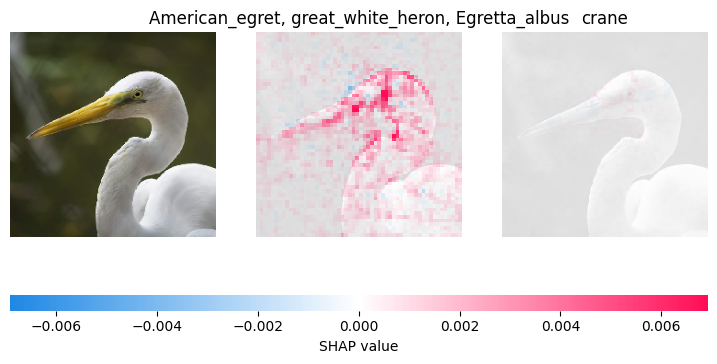

<Figure size 640x480 with 0 Axes>

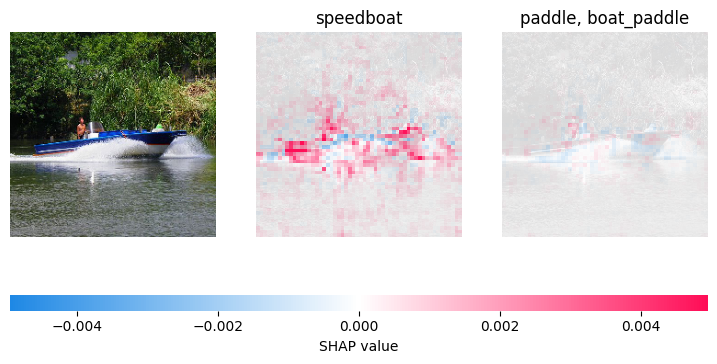

<Figure size 640x480 with 0 Axes>

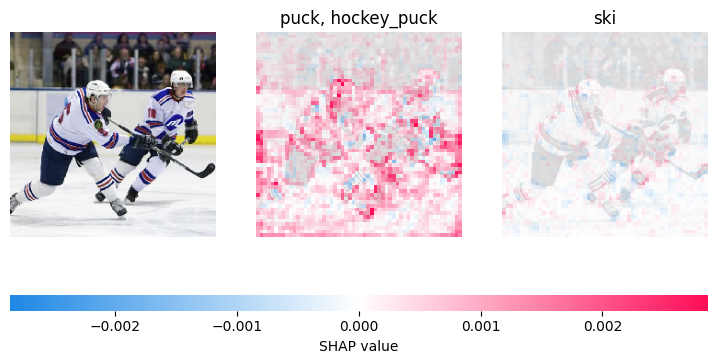

<Figure size 640x480 with 0 Axes>

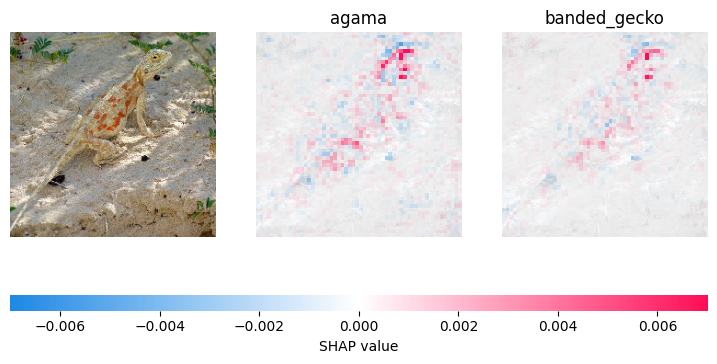

<Figure size 640x480 with 0 Axes>

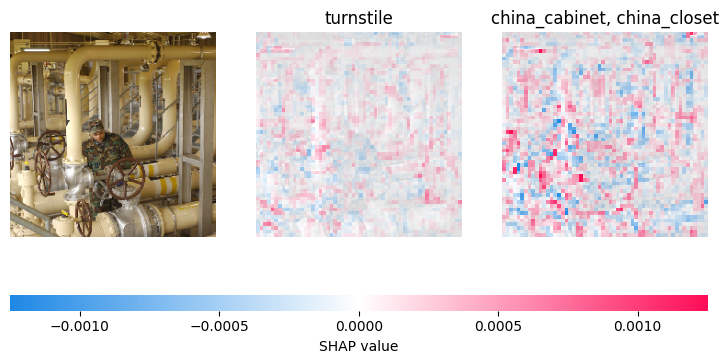

<Figure size 640x480 with 0 Axes>

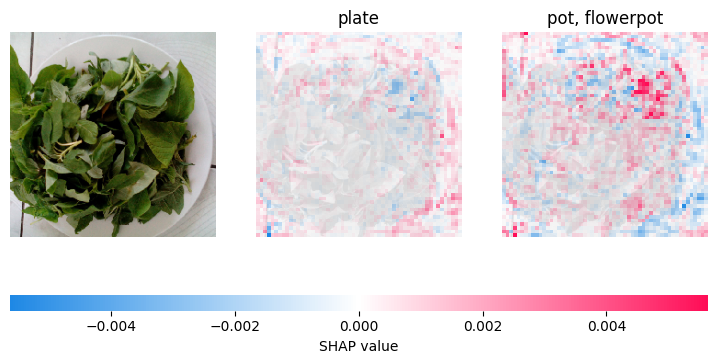

<Figure size 640x480 with 0 Axes>

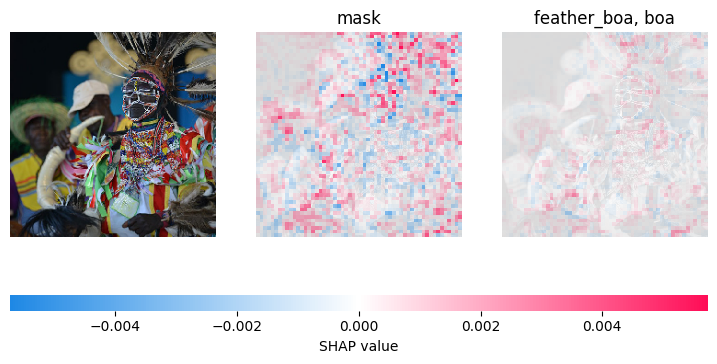

<Figure size 640x480 with 0 Axes>

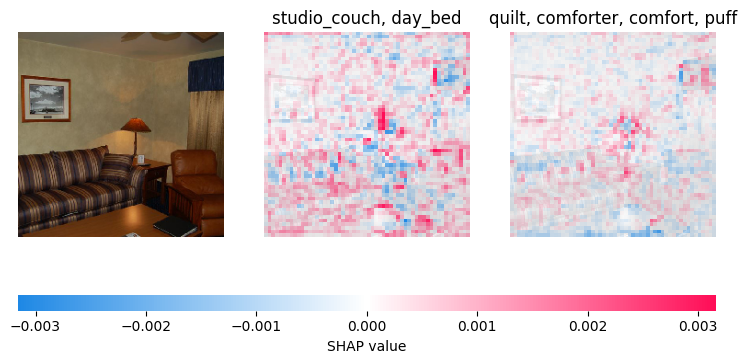

<Figure size 640x480 with 0 Axes>

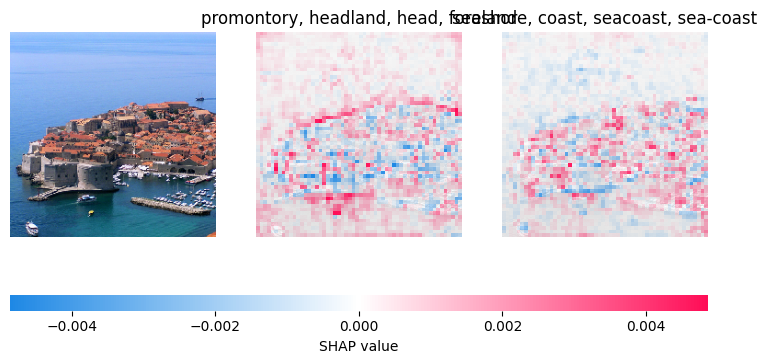

<Figure size 640x480 with 0 Axes>

In [ ]:
for i in range(1,10):
  to_explain = X[[i]]

  shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=2)

  # get the names for the classes from imagenet 1K labels
  index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
  index_names_1K = index_names_1K.tolist()[0]

  #map to imagenet 22K labels
  class_names_22K = [res[key] for key in index_names_1K] 

  # plot the explanations
  shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

  plt.savefig('shap_vgg16_' +str(i)+ '.png')

### imagenet22K test

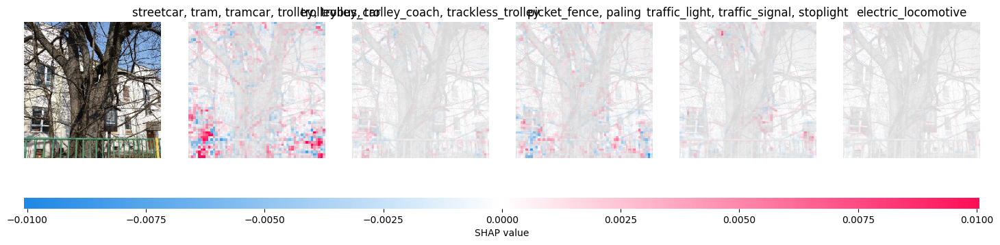

In [ ]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[0]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

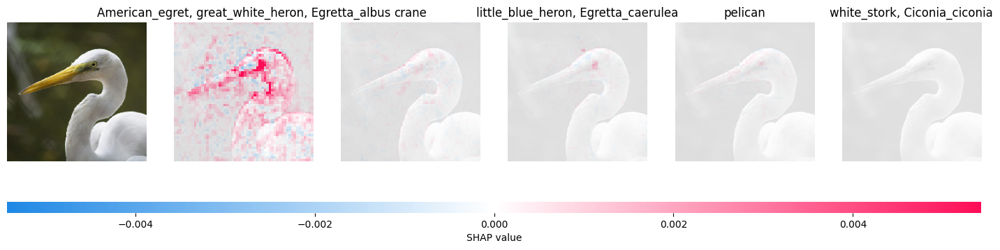

In [ ]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[1]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

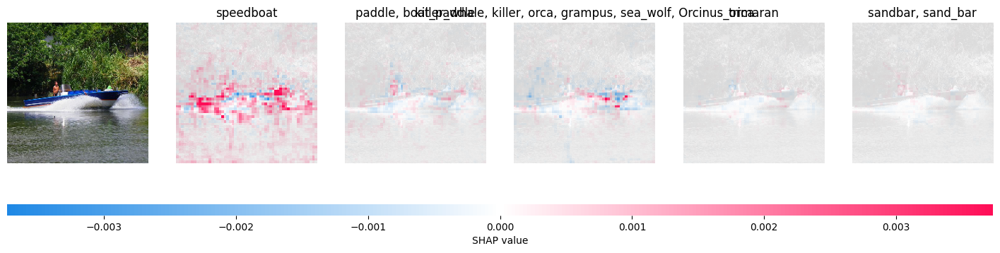

In [ ]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[2]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

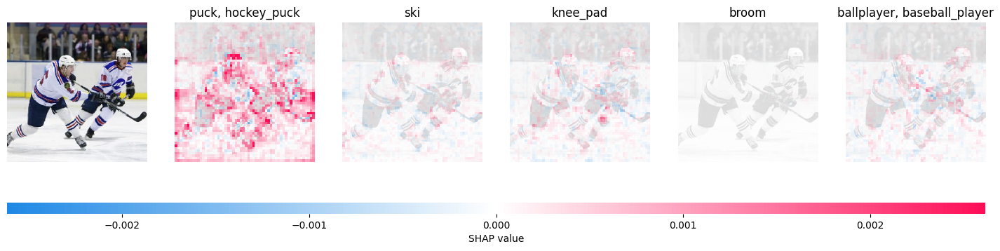

In [ ]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[3]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

### mapping 1K to 22K

In [ ]:
# class_names_1K
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]


['n02009912', 'n02012849', 'n02009229', 'n02051845', 'n02002556']

In [ ]:
# index_names_1K = keys
class_names_22K = [res[key] for key in index_names_1K]
class_names_22K

['American_egret, great_white_heron, Egretta_albus',
 'crane',
 'little_blue_heron, Egretta_caerulea',
 'pelican',
 'white_stork, Ciconia_ciconia']